# 00. Load Packages

In [1]:
import os
import pcraster as pcr
import pcr_tool

import numpy as np
import pandas as pd
import cartopy

os.environ['HTTPS_PROXY'] = 'http://proxy01.pnl.gov:3128'
os.environ['https_proxy'] = 'http://proxy01.pnl.gov:3128'

# 01. Basic Setup for a Bhutan watershed (Punatsangchhu, Wangchhu, Amochhu, and Jaldakah)

In [2]:
epsg_model = 5266 # Bhutan National Grid: a transverse Mercator projection
epsg_lonlat = 4326 # the common lon-lat coordinate system

path_prep = os.path.join('..', 'examples', 'Bhutan-PW', 'prep')
path_output = os.path.join('..', 'examples', 'Bhutan-PW', 'input')
os.makedirs(path_output, exist_ok = True)

flag_plot_aguila = False
flag_plot_cartopy = True

path_shape = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/SHAPE/btn_admbnda_adm1_bnlc_20201026.shp'
shape_geometry = cartopy.io.shapereader.Reader(path_shape).geometries()
shape_feature = cartopy.feature.ShapelyFeature(shape_geometry, crs = cartopy.crs.PlateCarree(), facecolor = 'none', linewidth = 0.25) # Bhutan Administrative Boundaries (Level 1)

# 02. Create Clonemap

First, we need to set an EPSG to define a clonemap.

In [3]:
map_clone = pcr_tool.clonemap(epsg = epsg_model)

Then, let's create a clonemap that defines a computational domain.

write_pcraster: written to ../examples/Bhutan-PW/input/clone.map.


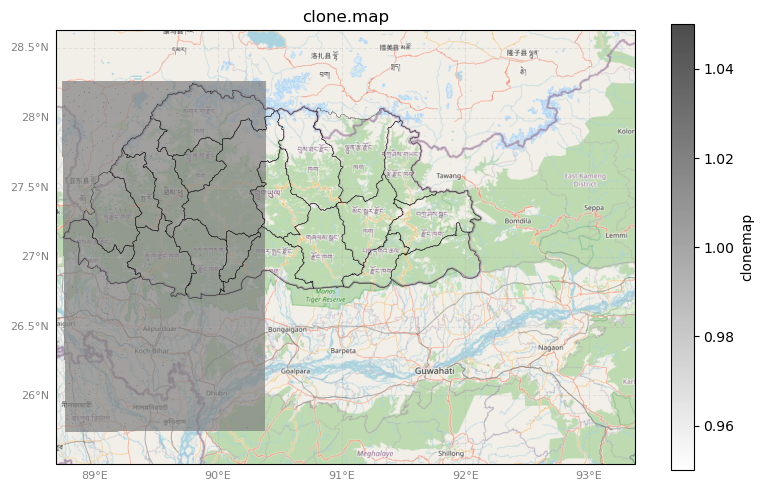

In [4]:
resolution = 1000 # 1km

#map_clone.create_clonemap(nrow = 348, ncol = 472, cellsize = resolution, west = 118000, north = 3168000) # Bhutan River Basin (west: 118000, east: 590000, south: 2820000, north: 3168000)
map_clone.create_clonemap(nrow = 280, ncol = 162, cellsize = resolution, west = 126000, north = 3128000) # HYBAS ID: 4060900670 (west: 126000, east: 288000, south: 2848000, north: 3128000)

map_clone.write_pcraster(os.path.join(path_output, 'clone.map'), field = map_clone.clonemap)

if flag_plot_aguila: pcr.aguila(map_clone.clonemap)
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_clone.clonemap, figsize = (8, 5), shapes = [shape_feature], basemap = cartopy.io.img_tiles.OSM(), basemap_level = 8, extent = [88.6875, 93.375, 25.5, 28.625], vmin = None, vmax = None, cmap = 'binary', alpha = 0.7, title = 'clone.map', clabel = 'clonemap', savefig = None)

# 03. Set DEM

Next, we're going to subset a DEM raster (e.g., HydroSHED Conditioned DEM) for the clonemap.

write_pcraster: written to ../examples/Bhutan-PW/input/dem.map.


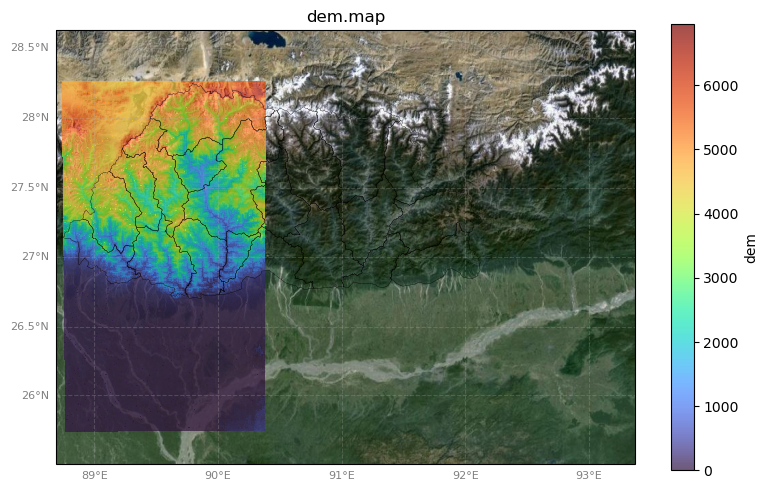

In [5]:
path_dem = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/DEM/as_con_3s_subset.tif'

map_dem = map_clone.read_raster(path = path_dem, epsg = epsg_lonlat, datatype = pcr.Scalar, band = 1)
map_dem = map_clone.set_dem(map_dem)

map_clone.write_pcraster(os.path.join(path_output, 'dem.map'), field = map_dem)

if flag_plot_aguila: pcr.aguila(map_dem)
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_dem, figsize = (8, 5), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 8, extent = [88.6875, 93.375, 25.5, 28.625], vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'dem.map', clabel = 'dem', savefig = None)

Here, we should be aware of the incomplete DEM raster that may need to be modified if necessary, based on hydrologic properties that will be derived in the next section.

# 04. Calculate Hydrologic Properties

First, we're going to calculate the slope property.

write_pcraster: written to ../examples/Bhutan-PW/input/slope.map.


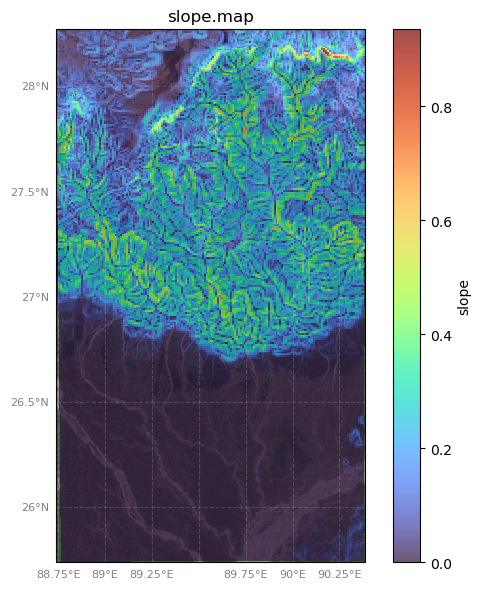

In [6]:
# one can directly use the pcraster function, pcraster.slope, to refine the function parameters
map_slope = map_clone.calculate_slope()

map_clone.write_pcraster(os.path.join(path_output, 'slope.map'), field = map_slope)

if flag_plot_aguila: pcr.aguila(map_slope)
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_slope, figsize = (6, 6), shapes = [], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'slope.map', clabel = 'slope', savefig = None)

write_pcraster: written to ../examples/Bhutan-PW/input/ldd.map.


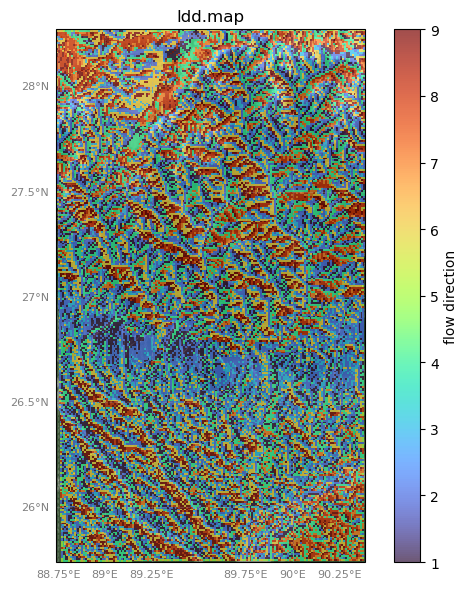

In [7]:
# one can directly use the pcraster function, pcraster.lddcreate, to refine the function parameters
map_flowdir = map_clone.calculate_flowdir()
map_clone.write_pcraster(os.path.join(path_output, 'ldd.map'), field = map_flowdir)

if flag_plot_aguila: pcr.aguila(map_flowdir)
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_flowdir, figsize = (6, 6), shapes = [], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'ldd.map', clabel = 'flow direction', savefig = None)

While this is not required for SPHY applications, but we can also check whether channels are aligned well as expected through streamorder and flow accumulation.

write_pcraster: written to ../examples/Bhutan-PW/input/streamorder.map.
write_pcraster: written to ../examples/Bhutan-PW/input/streamorder_ge3.map.


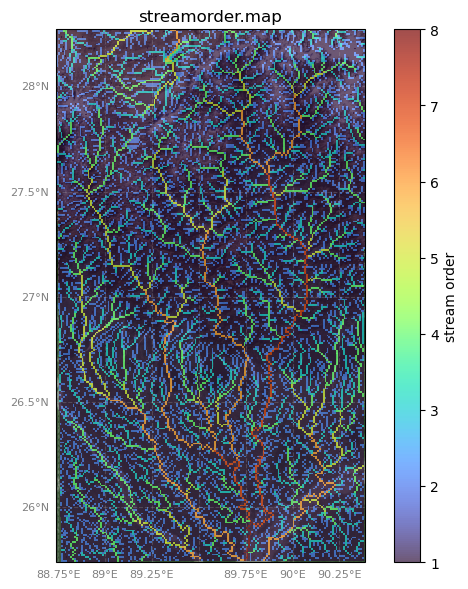

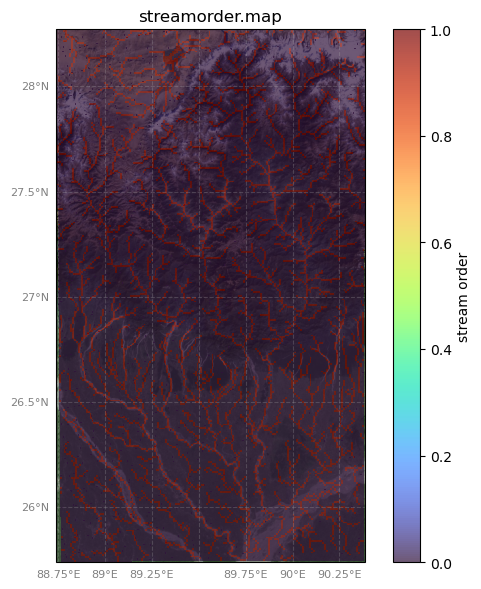

In [8]:
# one can directly use the pcraster function, pcraster.streamorder, to refine the function parameters
threshold_streamorder = 3

map_streamorder = map_clone.create_streamorder()
map_streamorder_threshold = pcr.ifthen(map_streamorder >= threshold_streamorder, pcr.boolean(1))

map_clone.write_pcraster(os.path.join(path_output, 'streamorder.map'), field = map_streamorder)
map_clone.write_pcraster(os.path.join(path_output, 'streamorder_ge{}.map'.format(threshold_streamorder)), field = map_streamorder_threshold)

if flag_plot_aguila:
    pcr.aguila(map_streamorder)
    pcr.aguila(map_streamorder_threshold)
if flag_plot_cartopy:
    map_clone.plot_cartopy(field = map_streamorder, figsize = (6, 6), shapes = [], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'streamorder.map', clabel = 'stream order', savefig = None)
    map_clone.plot_cartopy(field = map_streamorder_threshold, figsize = (6, 6), shapes = [], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'streamorder.map', clabel = 'stream order', savefig = None)

write_pcraster: written to ../examples/Bhutan-PW/input/accuflux.map.
write_pcraster: written to ../examples/Bhutan-PW/input/accuflux_ge25.map.


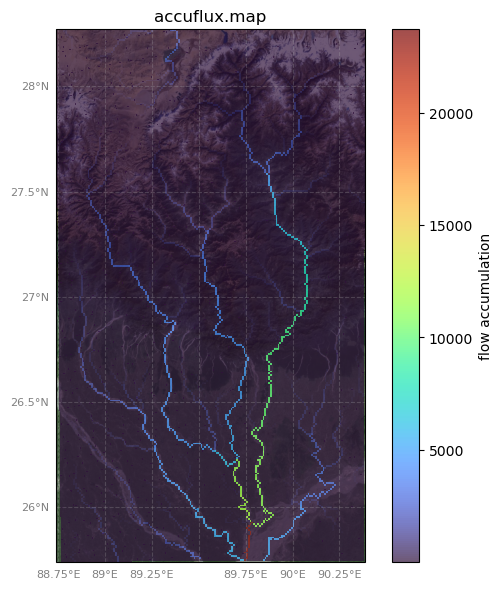

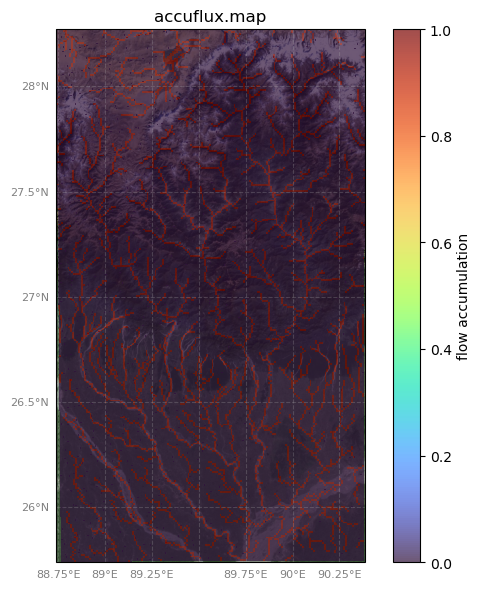

In [9]:
# one can directly use the pcraster function, pcraster.accuflux, to refine the function parameters
threshold_accuflux = 25

map_accuflux = map_clone.create_accuflux()
map_accuflux_threshold = pcr.ifthen(map_accuflux >= threshold_accuflux, pcr.boolean(1))

map_clone.write_pcraster(os.path.join(path_output, 'accuflux.map'), field = map_accuflux)
map_clone.write_pcraster(os.path.join(path_output, 'accuflux_ge{}.map'.format(threshold_accuflux)), field = map_accuflux_threshold)

if flag_plot_aguila:
    pcr.aguila(map_accuflux)
    pcr.aguila(map_accuflux_threshold)
if flag_plot_cartopy:
    map_clone.plot_cartopy(field = map_accuflux, figsize = (6, 6), shapes = [], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'accuflux.map', clabel = 'flow accumulation', savefig = None)
    map_clone.plot_cartopy(field = map_accuflux_threshold, figsize = (6, 6), shapes = [], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'accuflux.map', clabel = 'flow accumulation', savefig = None)

Let's assign outlet points and delineate catchments. Here, we're going to use only two outlet points to identify two large catchments.

[[ 237560.25869423 3053456.71084297]
 [ 235585.69429293 3053458.8818438 ]
 [ 241501.07934894 3041485.61486647]
 [ 239524.58499355 3041487.14329905]
 [ 255561.46660119 2980429.33011378]
 [ 253575.22833099 2980428.60776808]
 [ 229561.28366977 2867433.55042025]
 [ 227550.67173688 2863448.49132224]
 [ 225527.75684236 2853481.31691362]
 [ 221707.71645181 2849389.87097037]]
write_pcraster: written to ../examples/Bhutan-PW/input/outlet.map.


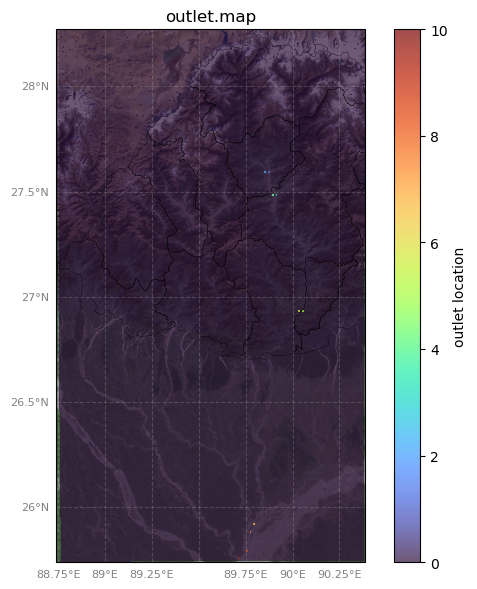

In [10]:
list_outlet = [
    [27.594, 89.874],
    [27.594, 89.854],
    [27.486, 89.914],
    [27.486, 89.894],
    [26.935, 90.056],
    [26.935, 90.036],
    [25.915, 89.796],
    [25.879, 89.776],
    [25.789, 89.756],
    [25.752, 89.718],
    ]
map_outlet, list_outlet_epsg_model = map_clone.create_outlet(outlets = list_outlet, epsg = epsg_lonlat)
print(list_outlet_epsg_model)

map_clone.write_pcraster(os.path.join(path_output, 'outlet.map'), field = map_outlet)

if flag_plot_aguila: pcr.aguila(map_outlet)
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_outlet, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'outlet.map', clabel = 'outlet location', savefig = None)

write_pcraster: written to ../examples/Bhutan-PW/input/catchment.map.


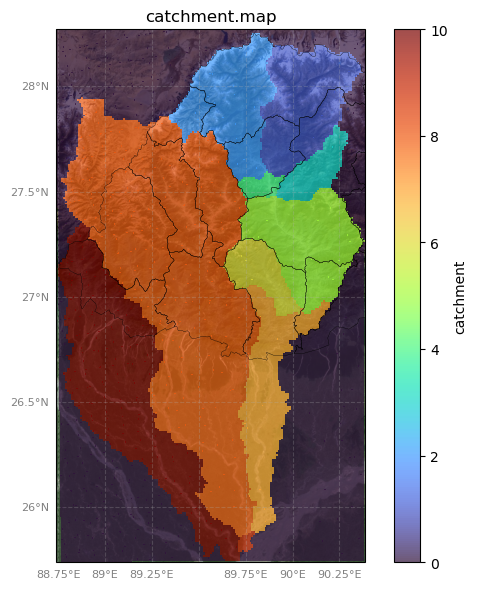

In [11]:
# one can directly use the pcraster function, pcraster.subcatchment, to refine the function parameters
map_catchment = map_clone.create_subcatchment()

map_clone.write_pcraster(os.path.join(path_output, 'catchment.map'), field = map_catchment)

if flag_plot_aguila: pcr.aguila(map_catchment)
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_catchment, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'catchment.map', clabel = 'catchment', savefig = None)

Also, we need to add other streamflow monitoring points of interest.

[[ 237560.25869423 3053456.71084297]
 [ 235585.69429293 3053458.8818438 ]
 [ 241501.07934894 3041485.61486647]
 [ 239524.58499355 3041487.14329905]
 [ 255561.46660119 2980429.33011378]
 [ 253575.22833099 2980428.60776808]
 [ 229561.28366977 2867433.55042025]
 [ 227550.67173688 2863448.49132224]
 [ 225527.75684236 2853481.31691362]
 [ 221707.71645181 2849389.87097037]
 [ 240665.54798526 3034372.16533966]
 [ 237505.30067363 3028546.36086042]
 [ 239590.09949752 3025463.92522747]
 [ 242052.26432252 2991699.31969612]
 [ 203504.65320765 2999960.88191679]
 [ 202577.6644649  2998701.1504747 ]
 [ 208704.71112207 2995188.91543258]
 [ 209854.10581051 2991694.74405422]
 [ 202458.8861283  3014314.74485583]
 [ 192647.01101952 3034302.84975543]
 [ 216388.5901274  3037539.44965255]
 [ 179766.40486611 3029936.90492835]
 [ 180254.75224086 3028825.95269886]]
write_pcraster: written to ../examples/Bhutan-PW/input/outlet.map.


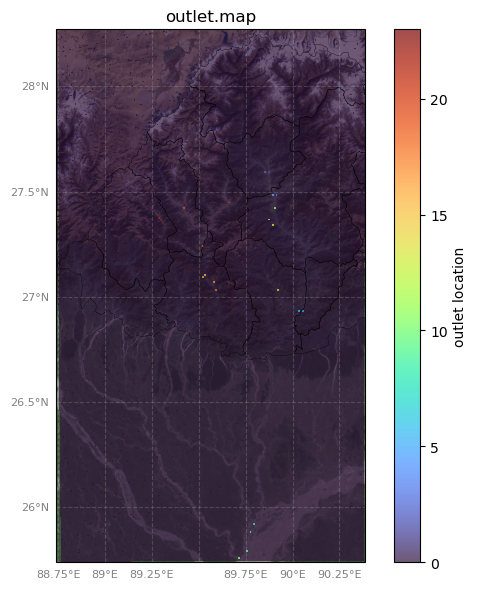

In [12]:
list_outlet = list_outlet + [
    [27.4218, 89.9056], # Punatsangchhu-I Hydropower Plant
    [27.3692, 89.8737], # Basochhu Hydropower Plant Upper
    [27.3414, 89.8948], # Basochhu Hydropower Plant Lower
    [27.0367, 89.9199], # Dagachhu Hydropower Plant
    [27.1105, 89.5311], # Chhukha Hydropower Plant
    [27.0991, 89.5218],
    [27.0676, 89.5837],
    [27.0361, 89.5954], # Tala Hydropower Plant
    [27.24, 89.52], # Tamchu on Wang Chhu Station, [27.24, 89.53] #19
    [27.42, 89.42], # Paro on Paro Chuu Station, [27.43, 89.43] #20
    [27.45, 89.66], # Lungtenphung on Thimp, #21
 #   [27.11, 89.53], # Chimakoti Dam on Wan = Chhukha Hydropower Plant, [27.1105, 89.5311] #15
    [27.38, 89.29], # Haa on Damchhu, [27.38, 89.29] #22
    [27.37, 89.295], # Haa on Haa Chhu, [27.37, 89.29] #23
    ]
map_outlet, list_outlet_epsg_model = map_clone.create_outlet(outlets = list_outlet, epsg = epsg_lonlat)
print(list_outlet_epsg_model)

map_clone.write_pcraster(os.path.join(path_output, 'outlet.map'), field = map_outlet)

if flag_plot_aguila: pcr.aguila(map_outlet)
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_outlet, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'outlet.map', clabel = 'outlet location', savefig = None)

**[Optional]** Instead, we can use the pcraster function, pcraster.pit, to set pits for outlet points and delineate catchments based on the pits.

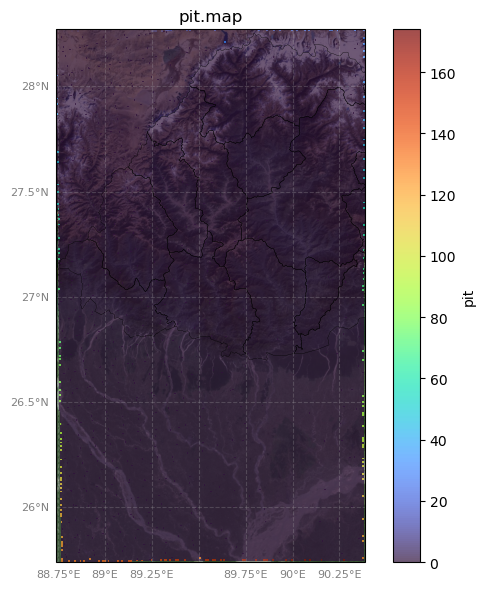

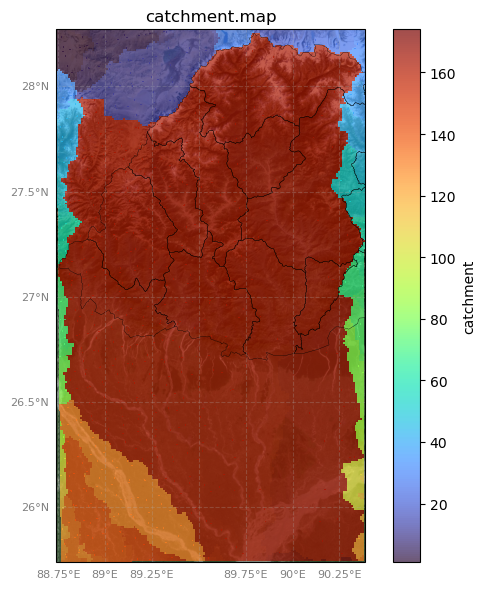

In [13]:
map_outlet_pit = pcr.pit(map_flowdir)
map_catchment_pit = pcr.catchment(map_flowdir, map_outlet_pit)

if flag_plot_aguila:
    pcr.aguila(map_outlet_pit)
    pcr.aguila(map_catchment_pit)
if flag_plot_cartopy:    
    map_clone.plot_cartopy(field = map_outlet_pit, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'pit.map', clabel = 'pit', savefig = None)
    map_clone.plot_cartopy(field = map_catchment_pit, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'catchment.map', clabel = 'catchment', savefig = None)

## 05. Set Soil-Related Hydrologic Properties

In this section, we're going to generate soil-related hydrologic properties.

write_pcraster: written to ../examples/Bhutan-PW/input/soil.map.


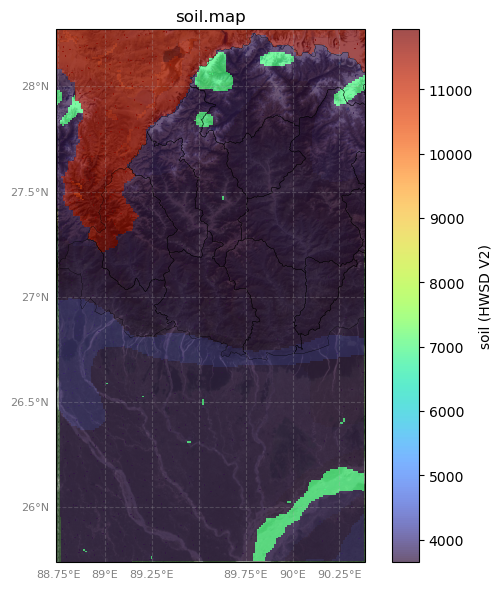

In [14]:
path_soil = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/SOIL/hwsd2_subset.tif'

map_soil = map_clone.read_raster(path = path_soil, epsg = epsg_lonlat, datatype = pcr.Nominal, band = 1)

map_clone.write_pcraster(os.path.join(path_output, 'soil.map'), field = map_soil)

if flag_plot_aguila: pcr.aguila(map_soil)
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_soil, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'soil.map', clabel = 'soil (HWSD V2)', savefig = None)

As the lookup tables for soil-related hydrologic properties are defined for Harmonized World Soil Database (HWSD) V1, we need to convert the soil map (HWSD V2) to map the properties correctly.

write_pcraster: written to ../examples/Bhutan-PW/input/soilref.map.


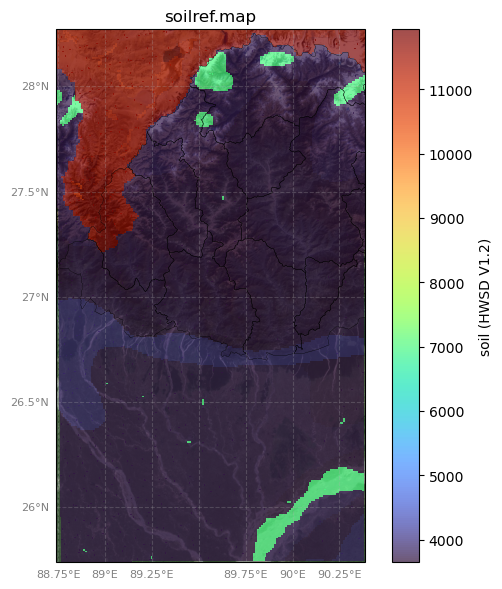

In [15]:
path_table_HWSD2to1 = os.path.join(path_prep, 'HWSD2to1.tbl')

map_soil_ref = pcr.lookupscalar(path_table_HWSD2to1, map_soil)

map_clone.write_pcraster(os.path.join(path_output, 'soilref.map'), field = map_soil)

if flag_plot_aguila: pcr.aguila(map_soil_ref)
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_soil_ref, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'soilref.map', clabel = 'soil (HWSD V1.2)', savefig = None)

Before generating soil-related hydrologic properties, we need to define the (uniform) depths for rootzone and subsoil.

write_pcraster: written to ../examples/Bhutan-PW/input/root_depth.map.
write_pcraster: written to ../examples/Bhutan-PW/input/sub_depth.map.


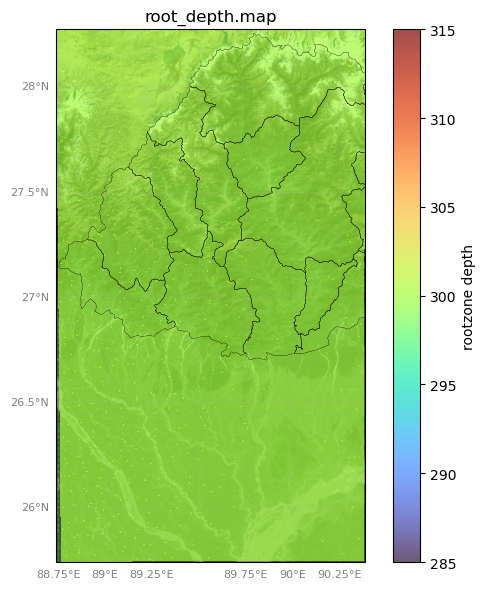

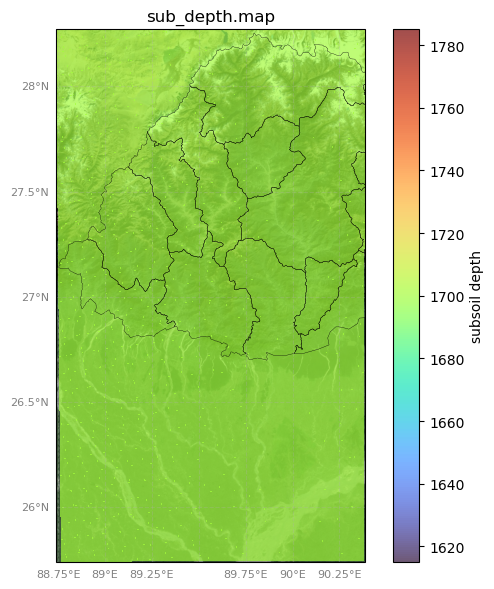

In [16]:
rootdepth = 300 # rootzone depth (mm)
subdepth = 1700 # subsoil depth (mm)

array_rootdepth = rootdepth * np.ones([map_clone.nrow, map_clone.ncol])
array_subdepth = subdepth * np.ones([map_clone.nrow, map_clone.ncol])
map_rootdepth = map_clone.from_numpy(array = array_rootdepth, datatype = pcr.Scalar, missing_value = 0)
map_subdepth = map_clone.from_numpy(array = array_subdepth, datatype = pcr.Scalar, missing_value = 0)

map_clone.write_pcraster(os.path.join(path_output, 'root_depth.map'), field = map_rootdepth)
map_clone.write_pcraster(os.path.join(path_output, 'sub_depth.map'), field = map_subdepth)

if flag_plot_aguila:
    pcr.aguila(map_rootdepth)
    pcr.aguila(map_subdepth)
if flag_plot_cartopy:
    map_clone.plot_cartopy(field = map_rootdepth, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'root_depth.map', clabel = 'rootzone depth', savefig = None)
    map_clone.plot_cartopy(field = map_subdepth, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'sub_depth.map', clabel = 'subsoil depth', savefig = None)

Let's generate soil-related hydrologic properties for rootzone and subsoil, based on the lookup tables defined for Harmonized World Soil Database (HWSD) V1

- field: field capacity
- pwlt: permanent wilting point
- satk: saturated hydraulic conductivity
- satwc: saturated water content
- wlt: wilting point

write_pcraster: written to ../examples/Bhutan-PW/input/root_field.map.
write_pcraster: written to ../examples/Bhutan-PW/input/root_pwlt.map.
write_pcraster: written to ../examples/Bhutan-PW/input/root_satk.map.
write_pcraster: written to ../examples/Bhutan-PW/input/root_satwc.map.
write_pcraster: written to ../examples/Bhutan-PW/input/root_wlt.map.
write_pcraster: written to ../examples/Bhutan-PW/input/sub_field.map.
write_pcraster: written to ../examples/Bhutan-PW/input/sub_satk.map.
write_pcraster: written to ../examples/Bhutan-PW/input/sub_satwc.map.


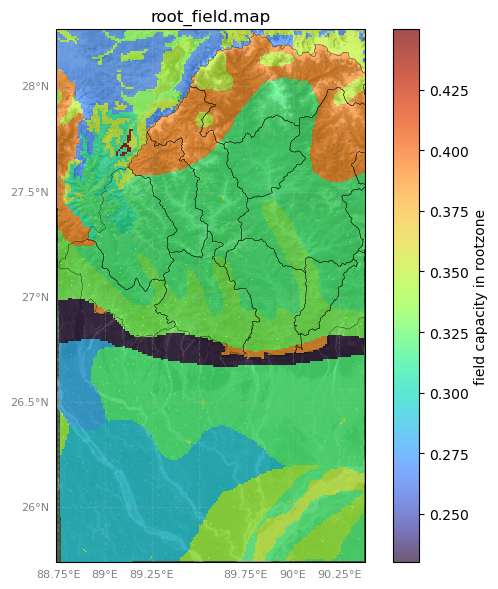

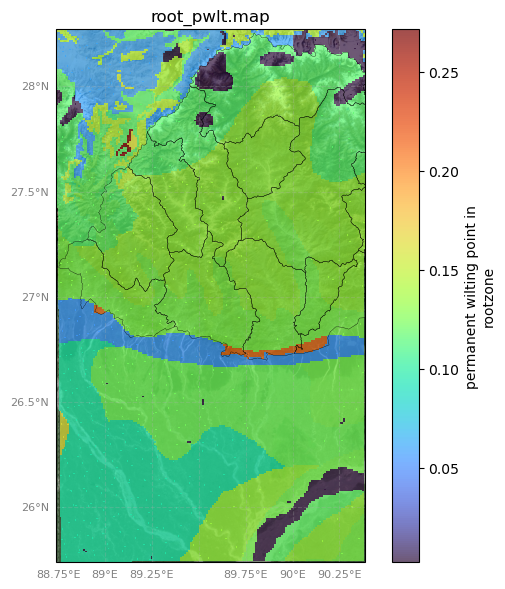

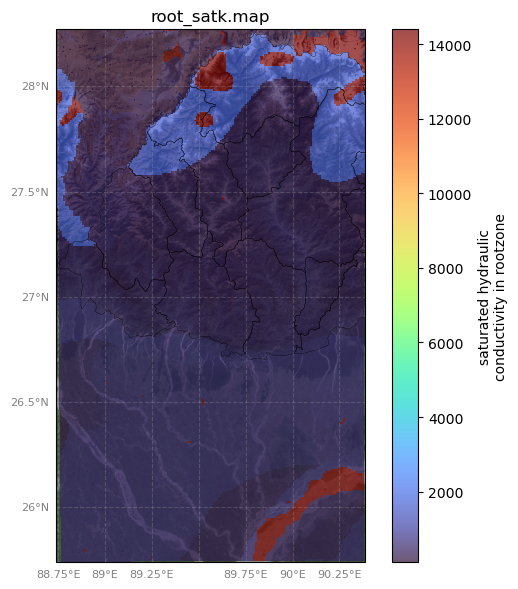

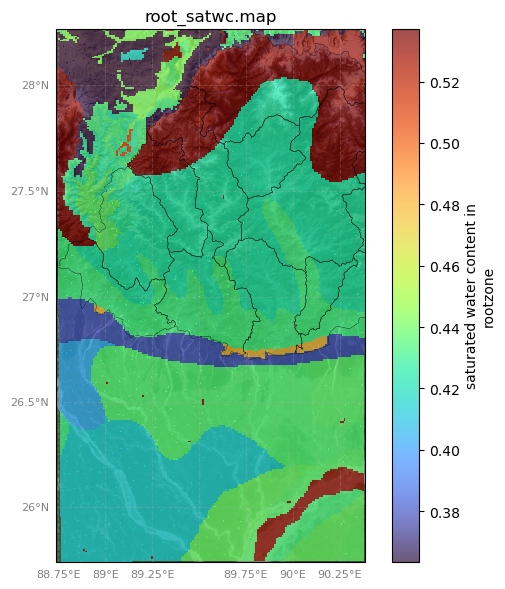

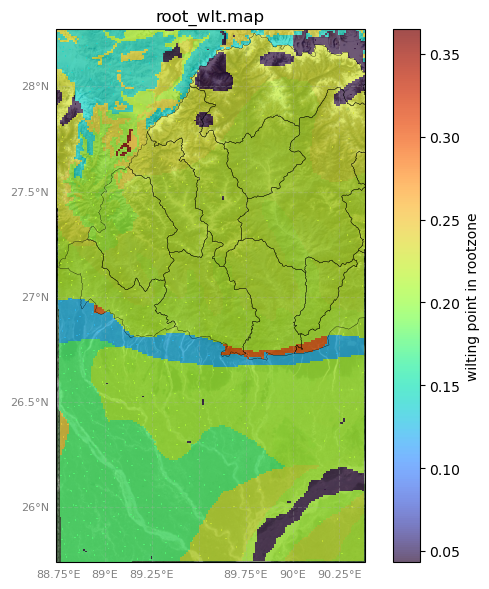

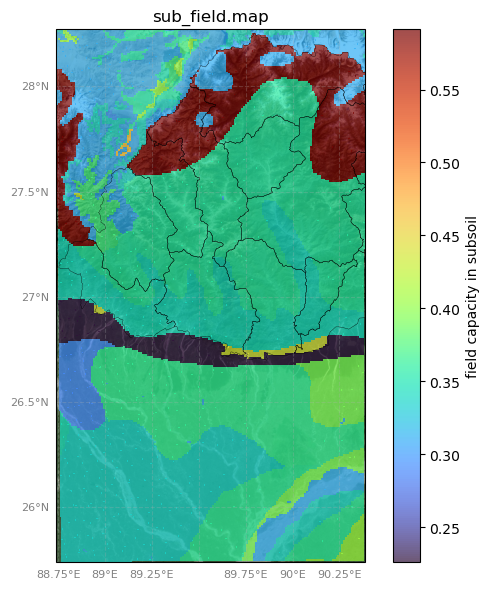

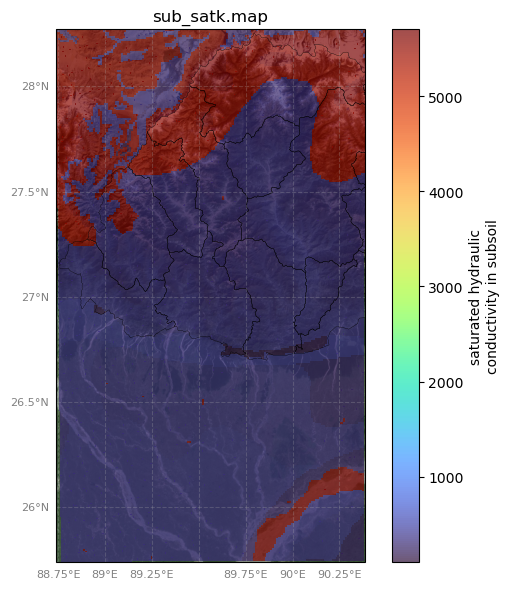

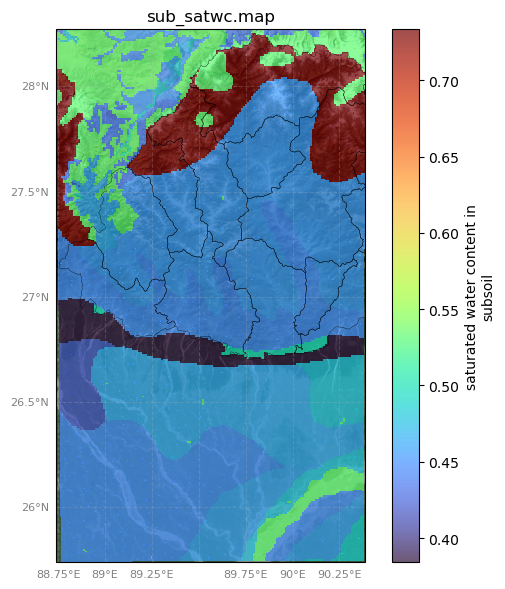

In [17]:
path_table_rfield = os.path.join(path_prep, 'root_field.tbl') # field capacity in rootzone (mm/mm)
path_table_rpwlt = os.path.join(path_prep, 'root_pwlt.tbl') # permanent wilting point in rootzone (mm/mm)
path_table_rsatk = os.path.join(path_prep, 'root_satk.tbl') # saturated hydraulic conductivity in rootzone (mm/day)
path_table_rsatwc = os.path.join(path_prep, 'root_satwc.tbl') # saturated water content in rootzone (mm/mm)
path_table_rwlt = os.path.join(path_prep, 'root_wlt.tbl') # wilting point in rootzone (mm/mm)
path_table_sfield = os.path.join(path_prep, 'sub_field.tbl') # field capacity in subsoil (mm/mm)
path_table_ssatk = os.path.join(path_prep, 'sub_satk.tbl') # saturated hydraulic conductivity in subsoil (mm/day)
path_table_ssatwc = os.path.join(path_prep, 'sub_satwc.tbl') # saturated water content in subsoil (mm/mm)

map_rfield = pcr.lookupscalar(path_table_rfield, map_soil_ref)
map_rpwlt = pcr.lookupscalar(path_table_rpwlt, map_soil_ref)
map_rsatk = pcr.lookupscalar(path_table_rsatk, map_soil_ref)
map_rsatwc = pcr.lookupscalar(path_table_rsatwc, map_soil_ref)
map_rwlt = pcr.lookupscalar(path_table_rwlt, map_soil_ref)
map_sfield = pcr.lookupscalar(path_table_sfield, map_soil_ref)
map_ssatk = pcr.lookupscalar(path_table_ssatk, map_soil_ref)
map_ssatwc = pcr.lookupscalar(path_table_ssatwc, map_soil_ref)

map_clone.write_pcraster(os.path.join(path_output, 'root_field.map'), field = map_rfield)
map_clone.write_pcraster(os.path.join(path_output, 'root_pwlt.map'), field = map_rpwlt)
map_clone.write_pcraster(os.path.join(path_output, 'root_satk.map'), field = map_rsatk)
map_clone.write_pcraster(os.path.join(path_output, 'root_satwc.map'), field = map_rsatwc)
map_clone.write_pcraster(os.path.join(path_output, 'root_wlt.map'), field = map_rwlt)
map_clone.write_pcraster(os.path.join(path_output, 'sub_field.map'), field = map_sfield)
map_clone.write_pcraster(os.path.join(path_output, 'sub_satk.map'), field = map_ssatk)
map_clone.write_pcraster(os.path.join(path_output, 'sub_satwc.map'), field = map_ssatwc)

if flag_plot_aguila:
    pcr.aguila(map_rfield)
    pcr.aguila(map_rpwlt)
    pcr.aguila(map_rsatk)
    pcr.aguila(map_rsatwc)
    pcr.aguila(map_rwlt)
    pcr.aguila(map_sfield)
    pcr.aguila(map_ssatk)
    pcr.aguila(map_ssatwc)
if flag_plot_cartopy:
    map_clone.plot_cartopy(field = map_rfield, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'root_field.map', clabel = 'field capacity in rootzone', savefig = None)
    map_clone.plot_cartopy(field = map_rpwlt, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'root_pwlt.map', clabel = 'permanent wilting point in rootzone', savefig = None)
    map_clone.plot_cartopy(field = map_rsatk, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'root_satk.map', clabel = 'saturated hydraulic conductivity in rootzone', savefig = None)
    map_clone.plot_cartopy(field = map_rsatwc, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'root_satwc.map', clabel = 'saturated water content in rootzone', savefig = None)
    map_clone.plot_cartopy(field = map_rwlt, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'root_wlt.map', clabel = 'wilting point in rootzone', savefig = None)
    map_clone.plot_cartopy(field = map_sfield, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'sub_field.map', clabel = 'field capacity in subsoil', savefig = None)
    map_clone.plot_cartopy(field = map_ssatk, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'sub_satk.map', clabel = 'saturated hydraulic conductivity in subsoil', savefig = None)
    map_clone.plot_cartopy(field = map_ssatwc, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'sub_satwc.map', clabel = 'saturated water content in subsoil', savefig = None)

**[Optional]** Instead, we can generate soil-related hydrologic properties directly by reading from available raster files, e.g., HiHydroSoil 250m.

write_pcraster: written to ../examples/Bhutan-PW/input/root_field_HHS.map.
write_pcraster: written to ../examples/Bhutan-PW/input/root_pwlt_HHS.map.
write_pcraster: written to ../examples/Bhutan-PW/input/root_satk_HHS.map.
write_pcraster: written to ../examples/Bhutan-PW/input/root_satwc_HHS.map.
write_pcraster: written to ../examples/Bhutan-PW/input/root_wlt_HHS.map.
write_pcraster: written to ../examples/Bhutan-PW/input/sub_field_HHS.map.
write_pcraster: written to ../examples/Bhutan-PW/input/sub_satk_HHS.map.
write_pcraster: written to ../examples/Bhutan-PW/input/sub_satwc_HHS.map.


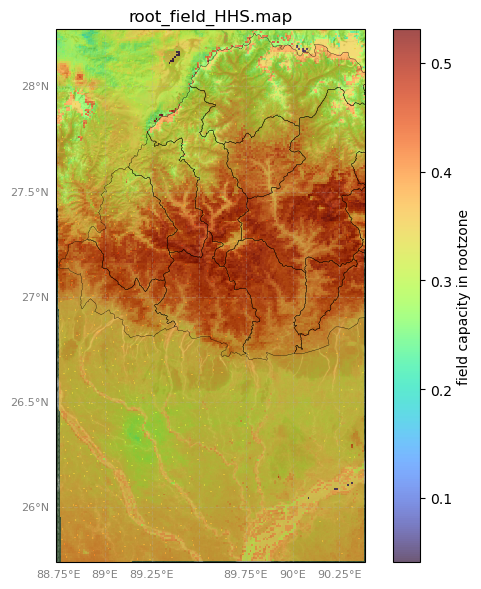

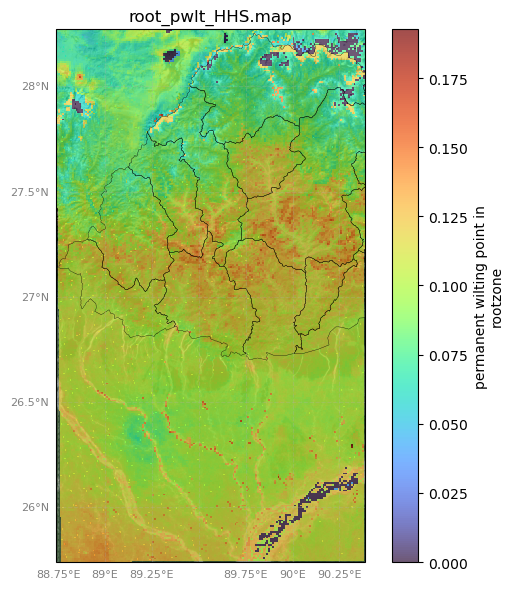

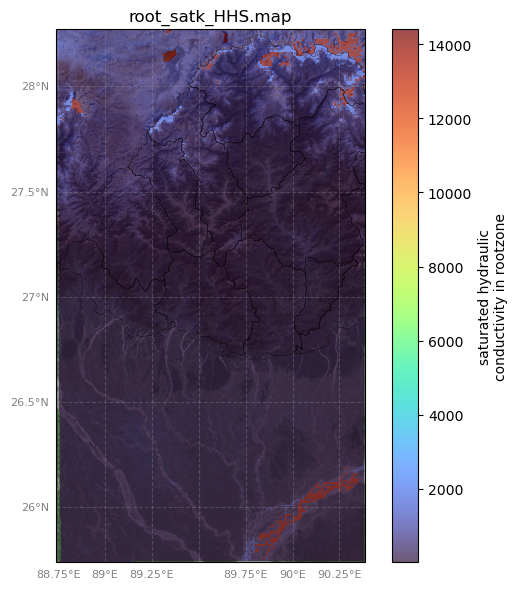

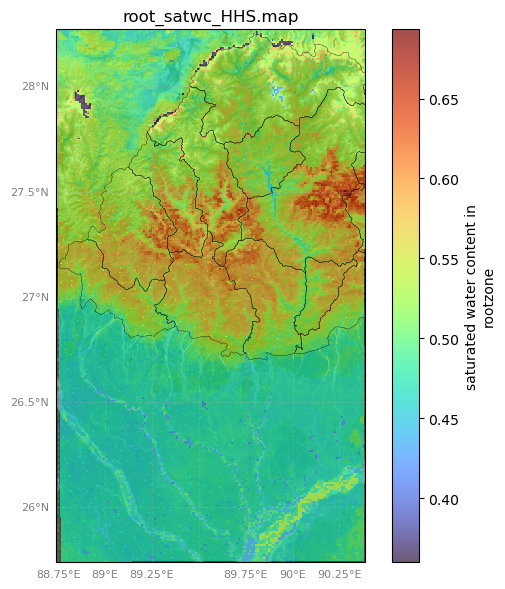

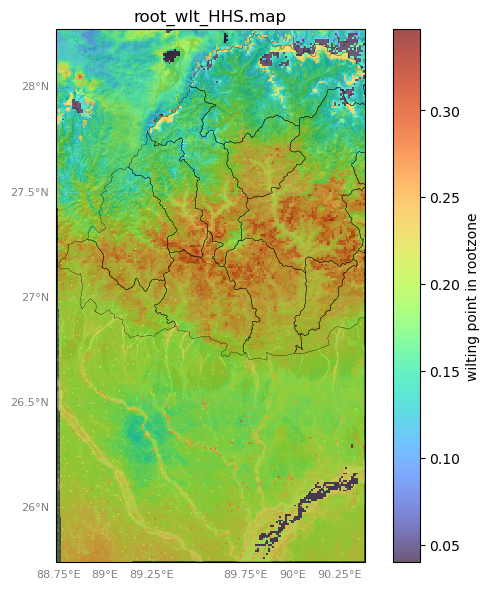

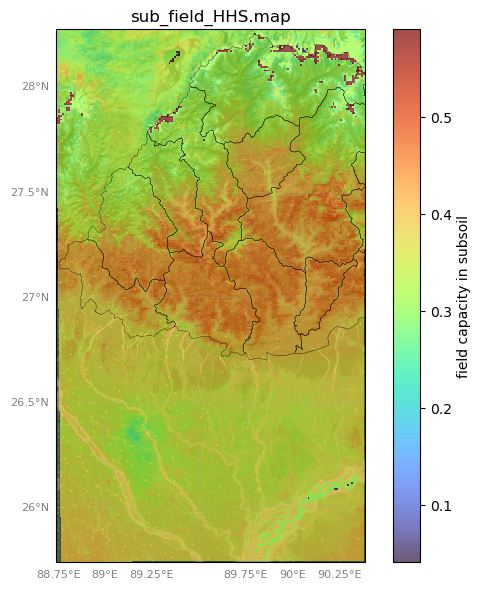

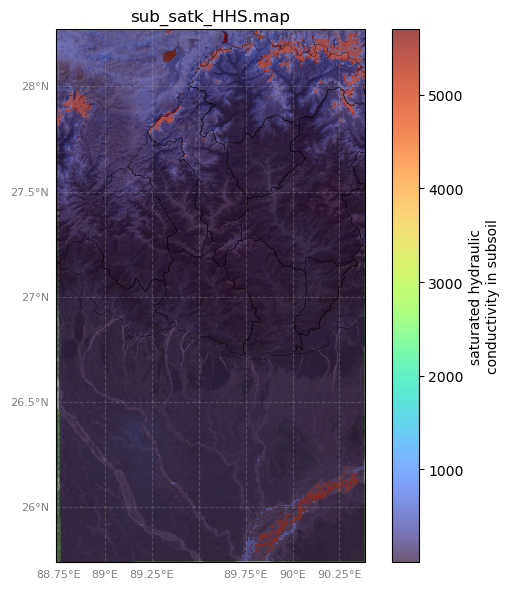

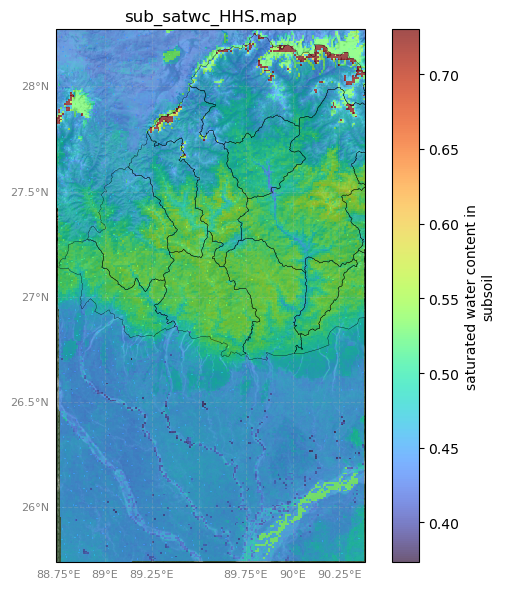

In [18]:
path_rfield_HHS = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/SOIL/WCpF2_M_250m_TOPSOIL_subset.tif' # field capacity in rootzone (mm/mm)
path_rpwlt_HHS = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/SOIL/WCpF4.2_M_250m_TOPSOIL_subset.tif' # permanent wilting point in rootzone (mm/mm)
path_rsatk_HHS = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/SOIL/Ksat_M_250m_TOPSOIL_subset.tif' # saturated hydraulic conductivity in rootzone (mm/day)
path_rsatwc_HHS = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/SOIL/WCsat_M_250m_TOPSOIL_subset.tif' # saturated water content in rootzone (mm/mm)
path_rwlt_HHS = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/SOIL/WCpF3_M_250m_TOPSOIL_subset.tif' # wilting point in rootzone (mm/mm)
path_sfield_HHS = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/SOIL/WCpF2_M_250m_SUBSOIL_subset.tif' # field capacity in subsoil (mm/mm)
path_ssatk_HHS = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/SOIL/Ksat_M_250m_SUBSOIL_subset.tif' # saturated hydraulic conductivity in subsoil (mm/day)
path_ssatwc_HHS = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/SOIL/WCsat_M_250m_SUBSOIL_subset.tif' # saturated water content in subsoil (mm/mm)

map_rfield_HHS = map_clone.read_raster(path = path_rfield_HHS, epsg = epsg_lonlat, datatype = pcr.Scalar, band = 1)
map_rpwlt_HHS = map_clone.read_raster(path = path_rpwlt_HHS, epsg = epsg_lonlat, datatype = pcr.Scalar, band = 1)
map_rsatk_HHS = map_clone.read_raster(path = path_rsatk_HHS, epsg = epsg_lonlat, datatype = pcr.Scalar, band = 1)
map_rsatwc_HHS = map_clone.read_raster(path = path_rsatwc_HHS, epsg = epsg_lonlat, datatype = pcr.Scalar, band = 1)
map_rwlt_HHS = map_clone.read_raster(path = path_rwlt_HHS, epsg = epsg_lonlat, datatype = pcr.Scalar, band = 1)
map_sfield_HHS = map_clone.read_raster(path = path_sfield_HHS, epsg = epsg_lonlat, datatype = pcr.Scalar, band = 1)
map_ssatk_HHS = map_clone.read_raster(path = path_ssatk_HHS, epsg = epsg_lonlat, datatype = pcr.Scalar, band = 1)
map_ssatwc_HHS = map_clone.read_raster(path = path_ssatwc_HHS, epsg = epsg_lonlat, datatype = pcr.Scalar, band = 1)

map_clone.write_pcraster(os.path.join(path_output, 'root_field_HHS.map'), field = map_rfield_HHS)
map_clone.write_pcraster(os.path.join(path_output, 'root_pwlt_HHS.map'), field = map_rpwlt_HHS)
map_clone.write_pcraster(os.path.join(path_output, 'root_satk_HHS.map'), field = map_rsatk_HHS)
map_clone.write_pcraster(os.path.join(path_output, 'root_satwc_HHS.map'), field = map_rsatwc_HHS)
map_clone.write_pcraster(os.path.join(path_output, 'root_wlt_HHS.map'), field = map_rwlt_HHS)
map_clone.write_pcraster(os.path.join(path_output, 'sub_field_HHS.map'), field = map_sfield_HHS)
map_clone.write_pcraster(os.path.join(path_output, 'sub_satk_HHS.map'), field = map_ssatk_HHS)
map_clone.write_pcraster(os.path.join(path_output, 'sub_satwc_HHS.map'), field = map_ssatwc_HHS)

if flag_plot_aguila:
    pcr.aguila(map_rfield_HHS)
    pcr.aguila(map_rpwlt_HHS)
    pcr.aguila(map_rsatk_HHS)
    pcr.aguila(map_rsatwc_HHS)
    pcr.aguila(map_rwlt_HHS)
    pcr.aguila(map_sfield_HHS)
    pcr.aguila(map_ssatk_HHS)
    pcr.aguila(map_ssatwc_HHS)
if flag_plot_cartopy:
    map_clone.plot_cartopy(field = map_rfield_HHS, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'root_field_HHS.map', clabel = 'field capacity in rootzone', savefig = None)
    map_clone.plot_cartopy(field = map_rpwlt_HHS, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'root_pwlt_HHS.map', clabel = 'permanent wilting point in rootzone', savefig = None)
    map_clone.plot_cartopy(field = map_rsatk_HHS, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'root_satk_HHS.map', clabel = 'saturated hydraulic conductivity in rootzone', savefig = None)
    map_clone.plot_cartopy(field = map_rsatwc_HHS, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'root_satwc_HHS.map', clabel = 'saturated water content in rootzone', savefig = None)
    map_clone.plot_cartopy(field = map_rwlt_HHS, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'root_wlt_HHS.map', clabel = 'wilting point in rootzone', savefig = None)
    map_clone.plot_cartopy(field = map_sfield_HHS, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'sub_field_HHS.map', clabel = 'field capacity in subsoil', savefig = None)
    map_clone.plot_cartopy(field = map_ssatk_HHS, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'sub_satk_HHS.map', clabel = 'saturated hydraulic conductivity in subsoil', savefig = None)
    map_clone.plot_cartopy(field = map_ssatwc_HHS, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'sub_satwc_HHS.map', clabel = 'saturated water content in subsoil', savefig = None)

## 06. Set Land-Related Hydrologic Properties

Next, we're going to generate land-related hydrologic properties.

write_pcraster: written to ../examples/Bhutan-PW/input/luse.map.


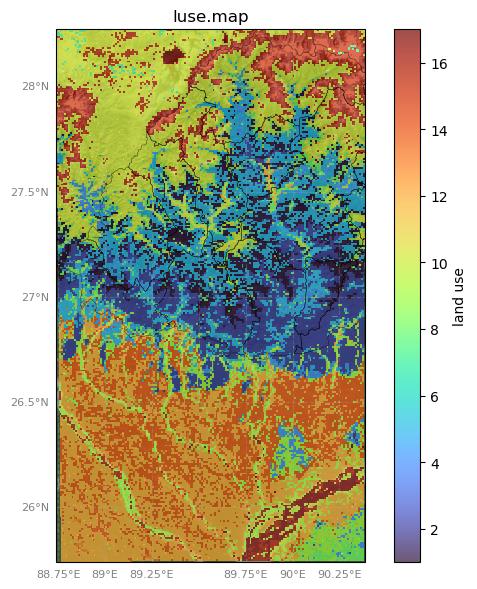

In [19]:
path_luse = '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/LAND/MCD12Q1.A2001001.tif'

map_luse = map_clone.read_raster(path = path_luse, epsg = epsg_lonlat, datatype = pcr.Nominal, band = 1)

map_clone.write_pcraster(os.path.join(path_output, 'luse.map'), field = map_luse)

if flag_plot_aguila: pcr.aguila(map_luse)
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_luse, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'luse.map', clabel = 'land use', savefig = None)

Then, we need to define the crop coefficients in *kc.tbl* with respect to the land use classification.

Lastly, SPHY requires a latitude pcraster map to calculate extraterrestrial radiation.

write_pcraster: written to ../examples/Bhutan-PW/input/latitude.map.


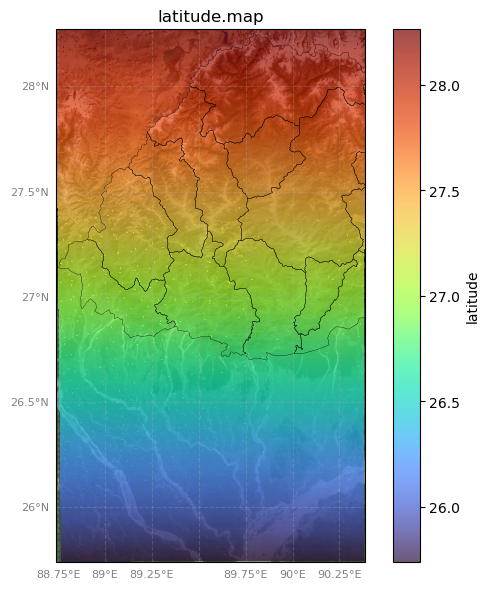

In [20]:
map_latitude = map_clone.create_latitude()

map_clone.write_pcraster(os.path.join(path_output, 'latitude.map'), field = map_latitude)

if flag_plot_aguila: pcr.aguila(map_latitude)
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_latitude, figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = 'latitude.map', clabel = 'latitude', savefig = None)

## 07. Generate Meteorological Forcing Datasets

Now, we're going to generate meteorological forcing files: daily precipitation, temperature average, temperature minimum, and temperature maximum, respectively.

In [21]:
path_forcing = [
    '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/FORCING/MSWX-Past_daily_subset_2002.nc',
    '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/FORCING/MSWX-Past_daily_subset_2003.nc',
    '/Users/sony061/Library/CloudStorage/OneDrive-PNNL/PNNL/Shared/External/SAGE II/FORCING/MSWX-Past_daily_subset_2004.nc',
]
start_date, end_date = '01/01/2002', '12/31/2004'
xdim, ydim, tdim = 'lon', 'lat', 'time'
var_prcp = 'precipitation'
var_tavg = 'air_temperature'
var_tmin = 'air_temperature_min'
var_tmax = 'air_temperature_max'
idx_plot = 2

tcoord = pd.date_range(start = pd.Timestamp(start_date), end = pd.Timestamp(end_date), freq = 'D')

write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.001 - #1/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.002 - #2/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.003 - #3/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.004 - #4/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.005 - #5/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.006 - #6/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.007 - #7/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.008 - #8/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.009 - #9/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.010 - #10/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.011 - #11/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/prcp/prcp0000.012 -

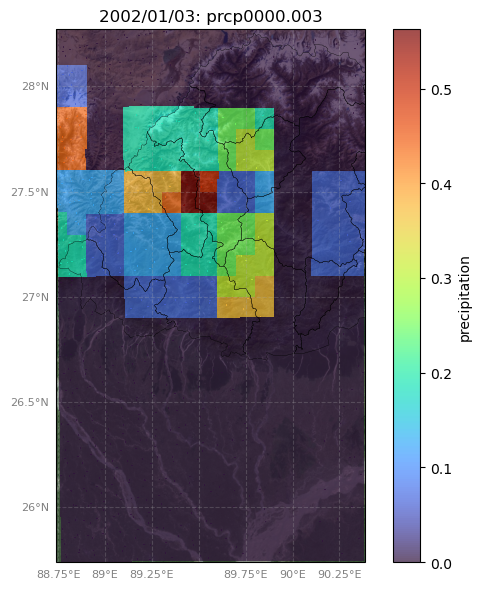

In [22]:
map_prcp = map_clone.read_netcdf(path = path_forcing, varname = var_prcp, epsg = epsg_lonlat, datatype = pcr.Scalar, xdim = xdim, ydim = ydim, tdim = tdim, tcoord = tcoord)

path_output_prcp = os.path.join(path_output, 'prcp')
os.makedirs(path_output_prcp, exist_ok = True)
path_prcp = [os.path.join(path_output_prcp, 'prcp{:08.3f}'.format((1 + n) / 1000)) for n in range(len(tcoord))]
map_clone.write_pcraster(path = path_prcp, field = map_prcp)

if flag_plot_aguila: pcr.aguila(map_prcp[idx_plot])
if flag_plot_cartopy: map_clone.plot_cartopy(field = map_prcp[idx_plot], figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = tcoord[idx_plot].strftime('%Y/%m/%d') + ': ' + os.path.basename(path_prcp[idx_plot]), clabel = 'precipitation', savefig = None)

write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.001 - #1/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.002 - #2/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.003 - #3/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.004 - #4/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.005 - #5/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.006 - #6/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.007 - #7/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.008 - #8/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.009 - #9/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.010 - #10/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.011 - #11/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tavg/tavg0000.012 -

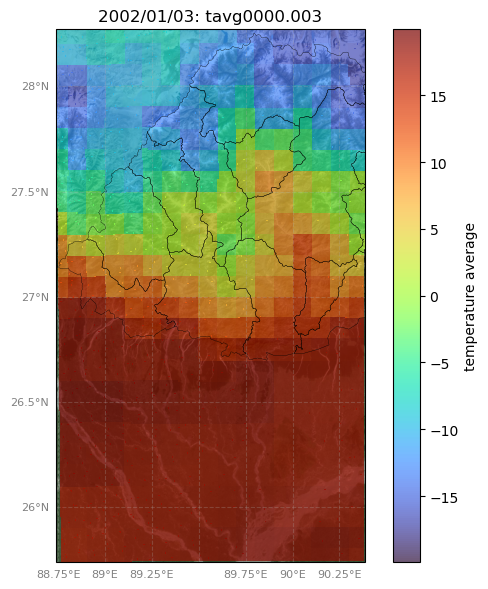

In [23]:
map_tavg = map_clone.read_netcdf(path = path_forcing, varname = var_tavg, epsg = epsg_lonlat, datatype = pcr.Scalar, xdim = xdim, ydim = ydim, tdim = tdim, tcoord = tcoord)

path_output_tavg = os.path.join(path_output, 'tavg')
os.makedirs(path_output_tavg, exist_ok = True)
path_tavg = [os.path.join(path_output_tavg, 'tavg{:08.3f}'.format((1 + n) / 1000)) for n in range(len(tcoord))]
map_clone.write_pcraster(path = path_tavg, field = map_tavg)

if flag_plot_aguila: pcr.aguila(path_tavg[idx_plot])
if flag_plot_cartopy: map_clone.plot_cartopy(field = path_tavg[idx_plot], figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = tcoord[idx_plot].strftime('%Y/%m/%d') + ': ' + os.path.basename(path_tavg[idx_plot]), clabel = 'temperature average', savefig = None)

write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.001 - #1/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.002 - #2/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.003 - #3/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.004 - #4/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.005 - #5/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.006 - #6/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.007 - #7/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.008 - #8/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.009 - #9/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.010 - #10/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.011 - #11/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmin/tmin0000.012 -

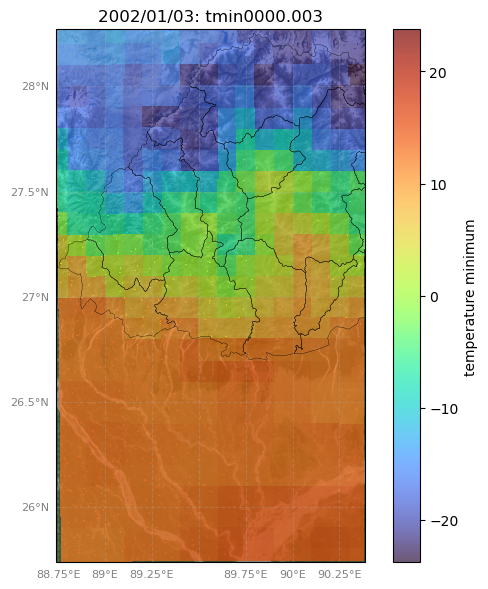

In [24]:
map_tmin = map_clone.read_netcdf(path = path_forcing, varname = var_tmin, epsg = epsg_lonlat, datatype = pcr.Scalar, xdim = xdim, ydim = ydim, tdim = tdim, tcoord = tcoord)

path_output_tmin = os.path.join(path_output, 'tmin')
os.makedirs(path_output_tmin, exist_ok = True)
path_tmin = [os.path.join(path_output_tmin, 'tmin{:08.3f}'.format((1 + n) / 1000)) for n in range(len(tcoord))]
map_clone.write_pcraster(path = path_tmin, field = map_tmin)

if flag_plot_aguila: pcr.aguila(path_tmin[idx_plot])
if flag_plot_cartopy: map_clone.plot_cartopy(field = path_tmin[idx_plot], figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = tcoord[idx_plot].strftime('%Y/%m/%d') + ': ' + os.path.basename(path_tmin[idx_plot]), clabel = 'temperature minimum', savefig = None)

write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.001 - #1/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.002 - #2/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.003 - #3/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.004 - #4/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.005 - #5/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.006 - #6/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.007 - #7/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.008 - #8/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.009 - #9/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.010 - #10/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.011 - #11/1096.
write_pcraster: written to ../examples/Bhutan-PW/input/tmax/tmax0000.012 -

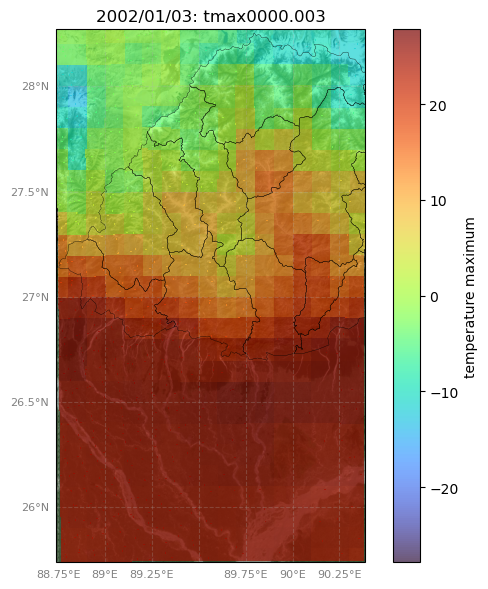

In [25]:
map_tmax = map_clone.read_netcdf(path = path_forcing, varname = var_tmax, epsg = epsg_lonlat, datatype = pcr.Scalar, xdim = xdim, ydim = ydim, tdim = tdim, tcoord = tcoord)

path_output_tmax = os.path.join(path_output, 'tmax')
os.makedirs(path_output_tmax, exist_ok = True)
path_tmax = [os.path.join(path_output_tmax, 'tmax{:08.3f}'.format((1 + n) / 1000)) for n in range(len(tcoord))]
map_clone.write_pcraster(path = path_tmax, field = map_tmax)

if flag_plot_aguila: pcr.aguila(path_tmax[idx_plot])
if flag_plot_cartopy: map_clone.plot_cartopy(field = path_tmax[idx_plot], figsize = (6, 6), shapes = [shape_feature], basemap = cartopy.io.img_tiles.GoogleTiles(style = 'satellite'), basemap_level = 10, extent = None, vmin = None, vmax = None, cmap = 'turbo', alpha = 0.7, title = tcoord[idx_plot].strftime('%Y/%m/%d') + ': ' + os.path.basename(path_tmax[idx_plot]), clabel = 'temperature maximum', savefig = None)